In [1]:
import os
import sys
from os.path import join
import json

from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nfl_data_py as nfl

ROOT_DIR = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.insert(0, os.path.join(ROOT_DIR,'py'))

import util

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

with open("paths.json", 'r') as f:
    paths = json.load(f)

PROCESSED_DATA_PATH = paths['processed_data']

In [2]:
WEEK = 1

df_tracking = pd.read_pickle(join(PROCESSED_DATA_PATH, f'wk{WEEK}', 'tracking.pkl'))
df_game = pd.read_pickle(join(PROCESSED_DATA_PATH, f'wk{WEEK}', 'games.pkl'))
df_play = pd.read_pickle(join(PROCESSED_DATA_PATH, f'wk{WEEK}', 'play.pkl'))
df_player_play = pd.read_pickle(join(PROCESSED_DATA_PATH, f'wk{WEEK}', 'player_play.pkl'))
df_player = pd.read_pickle(join(PROCESSED_DATA_PATH, 'players.pkl'))
df_team = pd.read_pickle(join(PROCESSED_DATA_PATH, 'teams.pkl'))

In [3]:
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np

tqdm.pandas()

def add_line_set_event(
    df_tracking: pd.DataFrame,
    events_col: str = 'event_new'
) -> None:

    WINDOW_WIDTH = 3
    LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
    SPEED_MULTIPLIER_THRESHOLD = 2.0
    SPEED_MULTIPLIER = 3
    MIN_AREA_PCT_ABOVE_THRESH = .01
    
    def set_lineset_frame_id(play: pd.DataFrame) -> pd.DataFrame:    
        off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()

        off_players['s'] = np.where(
            off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
            off_players['s'] * SPEED_MULTIPLIER, 
            off_players['s']
        )
        off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)
        
        off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

        differences = off_team_smoothed - LINE_SET_MEAN_SPEED_THRESHOLD
        df = pd.DataFrame(differences, columns=['s'], index=off_players.frame_id.unique()).rename({'s':'diff_with_speed_thresh'},axis=1)

        # Group by frames by the area groups above and below the thresholds
        df['above_thresh'] = np.where(df.diff_with_speed_thresh > 0, True, False)
        df['prev_above_thresh'] = df.above_thresh.shift(1).fillna(False)
        df['new_group'] = ((df.above_thresh & ~df.prev_above_thresh) | (~df.above_thresh & df.prev_above_thresh))
        df['group'] = df.new_group.cumsum()
        df.drop(['prev_above_thresh','new_group'],axis=1, inplace=True)
        df['area'] = df.groupby('group')['diff_with_speed_thresh'].transform('sum')
        tot_area = df.drop_duplicates('group')['area'].abs().sum()
        df['area_pct'] = df['area'].abs() / tot_area
        df['diff_with_speed_thresh'] = np.where(
            (df.area_pct < MIN_AREA_PCT_ABOVE_THRESH) & df.above_thresh,
            -1e-10, # set to very small negative so these points aren't selected as lineset 
            df.diff_with_speed_thresh
        )

        # If ah area above the thresh is too small (minor player movements), join it with area below the thresh (line_set)
        df['above_thresh'] = np.where(df.diff_with_speed_thresh > 0, True, False)
        df['prev_above_thresh'] = df.above_thresh.shift(1).fillna(False)
        df['new_group'] = ((df.above_thresh & ~df.prev_above_thresh) | (~df.above_thresh & df.prev_above_thresh))
        df['group'] = df.new_group.cumsum()
        df.drop(['prev_above_thresh','new_group'],axis=1, inplace=True)
        df['area'] = df.groupby('group')['diff_with_speed_thresh'].transform('sum')
        df['diff_with_speed_thresh'] = df['diff_with_speed_thresh'] * (df.index/1e3 + 1)
        line_set_frame_ids = df[~df.above_thresh].groupby('group').diff_with_speed_thresh.idxmin().values.tolist()
        line_set_frame_ids = [v for v in line_set_frame_ids if v == v] # remove np.nan values

        if line_set_frame_ids:
            play.loc[play[play['frame_id'].isin(line_set_frame_ids)].index, events_col] = 'line_set'
        else:
            frame_before_snap = play[play['frame_type']=="SNAP"].frame_id.iloc[0] - 1
            play.loc[play['frame_id'] == frame_before_snap, events_col] = 'line_set'
            gpid = play.game_play_id.iloc[0]
            print(f'WARNING: defaulted {gpid}\'s line_set value to one frame before ball snap.')
        
        return play

    return df_tracking.groupby('game_play_id', group_keys=False).progress_apply(set_lineset_frame_id)

def create_events(
    df_tracking: pd.DataFrame, 
    events_col: str = 'event_new'
) -> pd.DataFrame:
    '''Create events for line set and ball snap.

    Args:
        df_tracking: Tracking data
        events_col: Column name for the events
    Returns:
        DataFrame with the new events column
    '''

    if events_col in df_tracking.columns:
        df_tracking.drop(columns=events_col, inplace=True)
    
    df_tracking[events_col] = np.nan

    df_tracking = add_line_set_event(df_tracking, events_col=events_col)

    # Add 'ball_snap' event
    df_tracking.loc[df_tracking['frame_type'] == 'SNAP', events_col] = 'ball_snap'

    return df_tracking

In [4]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def plot_play(df_tracking, game_play_id, every_other_frame=True, event_col='event'):
    qry = 'game_play_id==@game_play_id'
    tracking_play = df_tracking.query(qry).copy().reset_index(drop=True)

    # Kepe every other frame, the first and last frames, and frames with events
    first_frame = tracking_play['frame_id'].min()
    last_frame = tracking_play['frame_id'].max()
    frames_with_events = tracking_play.groupby('frame_id')[event_col].transform('any')

    if every_other_frame:
        tracking_play = tracking_play[
            (tracking_play['frame_id'] == first_frame) | 
            (tracking_play['frame_id'] == last_frame) | 
            (frames_with_events) |
            (tracking_play['frame_id'] % 2 == 0)  # Keep even frames only
        ].copy().reset_index(drop=True)
    else:
        tracking_play = tracking_play[
            (tracking_play['frame_id'] == first_frame) | 
            (tracking_play['frame_id'] == last_frame) | 
            (frames_with_events)
        ].copy().reset_index(drop=True)

    frames = tracking_play['frame_id'].unique()
    current_event = [None]  

    field_width = 53.3

    fig, ax = plt.subplots(figsize=(10, 5))

    padding = 2
    min_y = tracking_play.y.min() - padding
    max_y = tracking_play.y.max() + padding

    los = tracking_play['absolute_yardline_number'].iloc[0]
    to_go_line = los + tracking_play['yards_to_go'].iloc[0]

    def update(frame_id):
        """Update function for each animation frame."""
        ax.clear()

        # can you make the field a light grey color?
        ax.set_facecolor('lightgrey')
        
        ax.set_yticks(np.arange(10, 110+1, 5))
        ax.grid(which='major', axis='y', linestyle='-', linewidth='0.5', color='black', zorder=1)

        for spine in ax.spines.values():
            spine.set_visible(False)

        ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

        ax.set_xlim(0, field_width)
        ax.set_ylim(min_y, max_y)

        current_frame = tracking_play.query('frame_id == @frame_id')
        offense = current_frame.query('offense')
        defense = current_frame.query('~offense and club != "football"')
        football = current_frame.query('club == "football"')

        # plot the los in blue
        ax.axhline(los, color='blue', linewidth=1.2, linestyle='-', zorder=1)

        # plot the line to go
        ax.axhline(to_go_line, color='yellow', linewidth=1.2, linestyle='-', zorder=1)

        # event = current_frame[event_col].iloc[0] if not current_frame[event_col].isna().all() else None
        # if event:
        #     current_event[0] = event

        ax.scatter(offense.x, offense.y, c='red', edgecolor='black', label='Offense', zorder=2)
        ax.scatter(defense.x, defense.y, c='blue', edgecolor='black', label='Defense', zorder=2)
        ax.scatter(football.x, football.y, c='brown', edgecolor='black', label='Football', s=20, zorder=3)

        event = current_frame[event_col].iloc[0]
        box_color = 'white'  # Default color
        alpha_value = 0.8    # Transparency value
        
        # Set box color based on event type
        if event == 'line_set':
            box_color = 'green'
            alpha_value = 0.5  # More transparency for the green box
        elif event == 'ball_snap':
            box_color = 'red'
            alpha_value = 0.5  # More transparency for the red box
        
        ax.text(
            1, max_y + 1.5, f"{event}",
            fontsize=12, ha='left', color='black',
            bbox=dict(facecolor=box_color, alpha=alpha_value),
            zorder=4
        )

        ax.text(52.3, max_y + 1.5, f"{frame_id / 10:.01f} s", fontsize=12, ha='right', color='black', 
                bbox=dict(facecolor='white', alpha=0.8), zorder=4)

    ani = FuncAnimation(fig, update, frames=frames, interval=100, repeat=False)

    plt.subplots_adjust(left=0, right=1, bottom=0, top=.9)

    plt.close(fig)

    return HTML(ani.to_jshtml(fps=5))

In [5]:
df_tracking = create_events(df_tracking)

  0%|          | 0/643 [00:00<?, ?it/s]

In [9]:
# Check that there is a line_set event for each play
df_tracking[df_tracking['event_new'] == 'line_set'].game_play_id.nunique() == df_play.game_play_id.nunique()

True

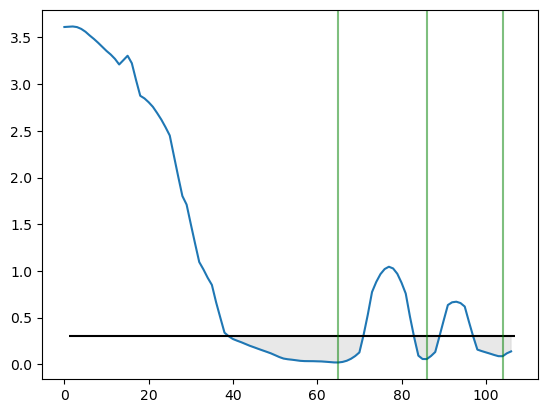

In [11]:
gpid = '2022091109_888'

WINDOW_WIDTH = 3
LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
SPEED_MULTIPLIER_THRESHOLD = 2.0
SPEED_MULTIPLIER = 3

play = df_tracking.query('game_play_id == @gpid').copy()
off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()
off_players['s'] = np.where(
    off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
    off_players['s'] * SPEED_MULTIPLIER, 
    off_players['s']
)
off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)

off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()

plt.plot(off_team_smoothed.index, off_team_smoothed)
plt.hlines(LINE_SET_MEAN_SPEED_THRESHOLD, xmin=1,xmax=off_players.frame_id.max(), color='black')
plt.fill_between(
    off_team_smoothed.index,  # x values
    off_team_smoothed,        # y values
    LINE_SET_MEAN_SPEED_THRESHOLD,  # baseline
    where=off_team_smoothed < LINE_SET_MEAN_SPEED_THRESHOLD,  # condition for shading
    interpolate=True,         # interpolates between points
    color='lightgrey',       # shading color
    alpha=0.5                 # transparency
)
for fid in fids:
    plt.axvline(fid, color='green', alpha=0.5)

plot_play(df_tracking, gpid, event_col=event_col)

In [97]:
differences = off_team_smoothed - LINE_SET_MEAN_SPEED_THRESHOLD
MIN_AREA_PCT_ABOVE_THRESH = .02
df = pd.DataFrame(differences, columns=['s'], index=off_players.frame_id.unique()).rename({'s':'diff_with_speed_thresh'},axis=1)
df['above_thresh'] = np.where(df.diff_with_speed_thresh > 0, True, False)
df['prev_above_thresh'] = df.above_thresh.shift(1).fillna(False)
df['new_group'] = ((df.above_thresh & ~df.prev_above_thresh) | (~df.above_thresh & df.prev_above_thresh))
df['group'] = df.new_group.cumsum()
df.drop(['prev_above_thresh','new_group'],axis=1, inplace=True)
df['area'] = df.groupby('group')['diff_with_speed_thresh'].transform('sum')
tot_area = df.drop_duplicates('group')['area'].abs().sum()
df['area_pct'] = df['area'].abs() / tot_area
df['diff_with_speed_thresh'] = np.where(
    (df.area_pct < MIN_AREA_PCT_ABOVE_THRESH) & df.above_thresh,
    -1e-10, # set to very small negative so these points aren't selected as lineset 
    df.diff_with_speed_thresh
)
df['above_thresh'] = np.where(df.diff_with_speed_thresh > 0, True, False)
df['prev_above_thresh'] = df.above_thresh.shift(1).fillna(False)
df['new_group'] = ((df.above_thresh & ~df.prev_above_thresh) | (~df.above_thresh & df.prev_above_thresh))
df['group'] = df.new_group.cumsum()
df.drop(['prev_above_thresh','new_group'],axis=1, inplace=True)
df['area'] = df.groupby('group')['diff_with_speed_thresh'].transform('sum')
df['diff_with_speed_thresh'] = df['diff_with_speed_thresh'] * (df.index/1e3 + 1)
df[~df.above_thresh].groupby('group').diff_with_speed_thresh.idxmin().values.tolist()
df

,diff_with_speed_thresh,above_thresh,group,area,area_pct
1,3.318467,True,1,83.959091,0.829691
2,3.324515,True,1,83.959091,0.829691
3,3.321146,True,1,83.959091,0.829691
4,3.304985,True,1,83.959091,0.829691
5,3.277823,True,1,83.959091,0.829691
6,3.240844,True,1,83.959091,0.829691
7,3.206837,True,1,83.959091,0.829691
8,3.168785,True,1,83.959091,0.829691
9,3.127594,True,1,83.959091,0.829691
10,3.086315,True,1,83.959091,0.829691


In [61]:
differences = off_team_smoothed - LINE_SET_MEAN_SPEED_THRESHOLD
MIN_AREA_PCT_ABOVE_THRESH = .02
df = pd.DataFrame(differences, columns=['s'], index=off_players.frame_id.unique()).rename({'s':'diff_with_speed_thresh'},axis=1)
df['above_thresh'] = np.where(df.diff_with_speed_thresh > 0, True, False)
df['prev_above_thresh'] = df.above_thresh.shift(1).fillna(False)
df['new_group'] = ((df.above_thresh & ~df.prev_above_thresh) | (~df.above_thresh & df.prev_above_thresh))
df['group'] = df.new_group.cumsum()
df.drop(['prev_above_thresh','new_group'],axis=1, inplace=True)
df['area'] = df.groupby('group')['diff_with_speed_thresh'].transform('sum')
tot_area = df.drop_duplicates('group')['area'].abs().sum()
df['area_pct'] = df['area'].abs() / tot_area
df['diff_with_speed_thresh'] = np.where(
    (df.area_pct < MIN_AREA_PCT_ABOVE_THRESH) & df.above_thresh,
    -1e-10, # set to very small negative so these points aren't selected as lineset 
    df.diff_with_speed_thresh
)
df['above_thresh'] = np.where(df.diff_with_speed_thresh > 0, True, False)
df['prev_above_thresh'] = df.above_thresh.shift(1).fillna(False)
df['new_group'] = ((df.above_thresh & ~df.prev_above_thresh) | (~df.above_thresh & df.prev_above_thresh))
df['group'] = df.new_group.cumsum()
df.drop(['prev_above_thresh','new_group'],axis=1, inplace=True)
df['area'] = df.groupby('group')['diff_with_speed_thresh'].transform('sum')
df['diff_with_speed_thresh'] = df['diff_with_speed_thresh'] * (df.index/1e3 + 1)
df[~df.above_thresh].groupby('group').diff_with_speed_thresh.idxmin().values.tolist()
df.iloc[80:150]

,diff_with_speed_thresh,above_thresh,group,area,area_pct
81,2.620606e-02,True,3,11.687879,0.189528
82,2.623030e-03,True,3,11.687879,0.189528
83,-1.542455e-02,False,4,-0.123939,0.002010
84,-2.660727e-02,False,4,-0.123939,0.002010
85,-2.926212e-02,False,4,-0.123939,0.002010
86,-2.698545e-02,False,4,-0.123939,0.002010
87,-2.108121e-02,False,4,-0.123939,0.002010
88,-1.516606e-02,False,4,-0.123939,0.002010
89,1.257300e-01,True,5,1.767576,0.028663
90,2.678758e-01,True,5,1.767576,0.028663


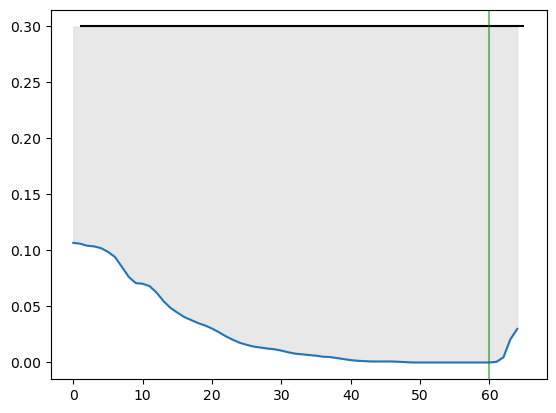

In [100]:
# no line_set w/o motion or shift
gpid = '2022091100_1359'
WINDOW_WIDTH = 3
LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
SPEED_MULTIPLIER_THRESHOLD = 2.0
SPEED_MULTIPLIER = 3

play = df_tracking.query('game_play_id == @gpid').copy()
off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()
off_players['s'] = np.where(
    off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
    off_players['s'] * SPEED_MULTIPLIER, 
    off_players['s']
)
off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)

off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

import matplotlib.pyplot as plt

event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
# print([f/10 for f in fids])
# print(play[event_col].value_counts() / 23)

plt.plot(off_team_smoothed.index, off_team_smoothed)
plt.hlines(LINE_SET_MEAN_SPEED_THRESHOLD, xmin=1,xmax=off_players.frame_id.max(), color='black')
plt.fill_between(
    off_team_smoothed.index,  # x values
    off_team_smoothed,        # y values
    LINE_SET_MEAN_SPEED_THRESHOLD,  # baseline
    where=off_team_smoothed < LINE_SET_MEAN_SPEED_THRESHOLD,  # condition for shading
    interpolate=True,         # interpolates between points
    color='lightgrey',       # shading color
    alpha=0.5                 # transparency
)
for fid in fids:
    plt.axvline(fid, color='green', alpha=0.5)

plot_play(df_tracking, gpid, event_col=event_col)

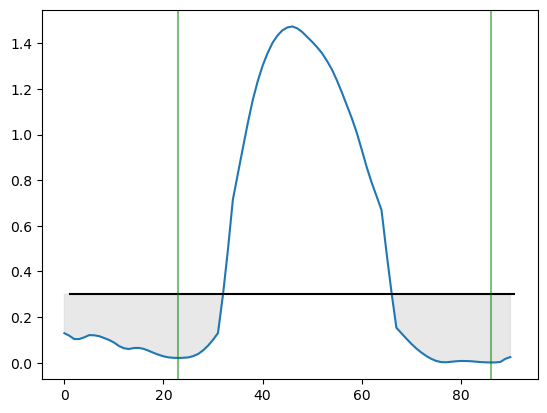

In [101]:
# no line_set w/ shift
gpid = '2022091100_3334'
WINDOW_WIDTH = 3
LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
SPEED_MULTIPLIER_THRESHOLD = 2.0
SPEED_MULTIPLIER = 3

play = df_tracking.query('game_play_id == @gpid').copy()
off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()
off_players['s'] = np.where(
    off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
    off_players['s'] * SPEED_MULTIPLIER, 
    off_players['s']
)
off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)

off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

import matplotlib.pyplot as plt

event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
# print([f/10 for f in fids])
# print(play[event_col].value_counts() / 23)

plt.plot(off_team_smoothed.index, off_team_smoothed)
plt.hlines(LINE_SET_MEAN_SPEED_THRESHOLD, xmin=1,xmax=off_players.frame_id.max(), color='black')
plt.fill_between(
    off_team_smoothed.index,  # x values
    off_team_smoothed,        # y values
    LINE_SET_MEAN_SPEED_THRESHOLD,  # baseline
    where=off_team_smoothed < LINE_SET_MEAN_SPEED_THRESHOLD,  # condition for shading
    interpolate=True,         # interpolates between points
    color='lightgrey',       # shading color
    alpha=0.5                 # transparency
)
for fid in fids:
    plt.axvline(fid, color='green', alpha=0.5)

plot_play(df_tracking, gpid, event_col=event_col)

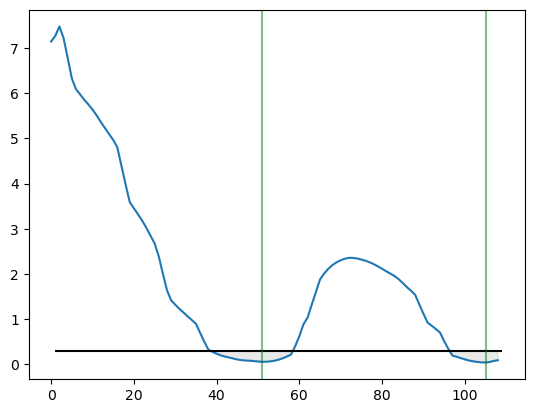

In [102]:
# no line_set w/ shift
gpid = '2022091102_1837'
WINDOW_WIDTH = 3
LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
SPEED_MULTIPLIER_THRESHOLD = 2.0
SPEED_MULTIPLIER = 3

play = df_tracking.query('game_play_id == @gpid').copy()
off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()
off_players['s'] = np.where(
    off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
    off_players['s'] * SPEED_MULTIPLIER, 
    off_players['s']
)
off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)

off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

import matplotlib.pyplot as plt

event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
# print([f/10 for f in fids])
# print(play[event_col].value_counts() / 23)

plt.plot(off_team_smoothed.index, off_team_smoothed)
plt.hlines(LINE_SET_MEAN_SPEED_THRESHOLD, xmin=1,xmax=off_players.frame_id.max(), color='black')
plt.fill_between(
    off_team_smoothed.index,  # x values
    off_team_smoothed,        # y values
    LINE_SET_MEAN_SPEED_THRESHOLD,  # baseline
    where=off_team_smoothed < LINE_SET_MEAN_SPEED_THRESHOLD,  # condition for shading
    interpolate=True,         # interpolates between points
    color='lightgrey',       # shading color
    alpha=0.5                 # transparency
)
for fid in fids:
    plt.axvline(fid, color='green', alpha=0.5)

plot_play(df_tracking, gpid, event_col=event_col)

In [155]:
# no line_set w/ shift
#TODO: PROBLEM PLAY - classifiying lineset after shifts
gpid = '2022091102_2738'
event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
print([f/10 for f in fids])
print(play[event_col].value_counts() / 23)
plot_play(df_tracking, gpid, event_col=event_col)

[10.7]
line_set     1.0
ball_snap    1.0
Name: event_new, dtype: float64


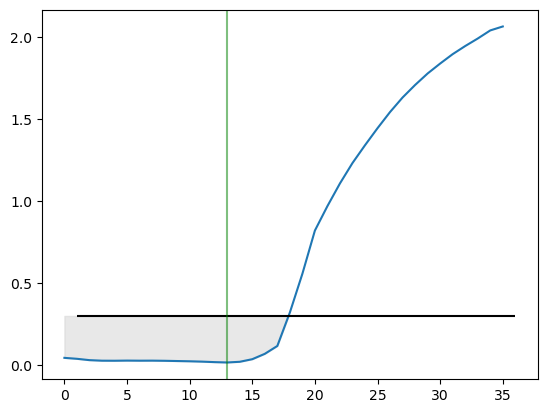

In [103]:
# no line_set w/ Jet motion
gpid = '2022091103_2008'
WINDOW_WIDTH = 3
LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
SPEED_MULTIPLIER_THRESHOLD = 2.0
SPEED_MULTIPLIER = 3

play = df_tracking.query('game_play_id == @gpid').copy()
off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()
off_players['s'] = np.where(
    off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
    off_players['s'] * SPEED_MULTIPLIER, 
    off_players['s']
)
off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)

off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

import matplotlib.pyplot as plt

event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
# print([f/10 for f in fids])
# print(play[event_col].value_counts() / 23)

plt.plot(off_team_smoothed.index, off_team_smoothed)
plt.hlines(LINE_SET_MEAN_SPEED_THRESHOLD, xmin=1,xmax=off_players.frame_id.max(), color='black')
plt.fill_between(
    off_team_smoothed.index,  # x values
    off_team_smoothed,        # y values
    LINE_SET_MEAN_SPEED_THRESHOLD,  # baseline
    where=off_team_smoothed < LINE_SET_MEAN_SPEED_THRESHOLD,  # condition for shading
    interpolate=True,         # interpolates between points
    color='lightgrey',       # shading color
    alpha=0.5                 # transparency
)
for fid in fids:
    plt.axvline(fid, color='green', alpha=0.5)

plot_play(df_tracking, gpid, event_col=event_col)

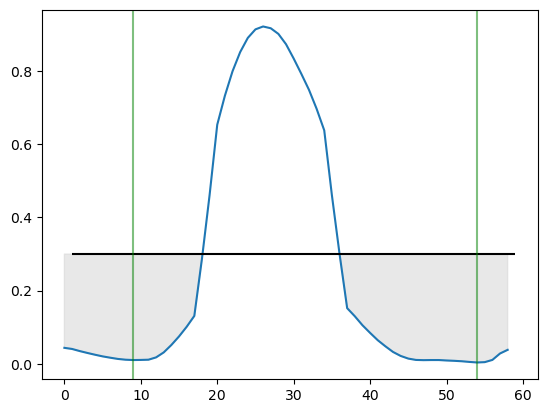

In [104]:
# no line_set w/ shift
gpid = '2022091103_2414'
WINDOW_WIDTH = 3
LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
SPEED_MULTIPLIER_THRESHOLD = 2.0
SPEED_MULTIPLIER = 3

play = df_tracking.query('game_play_id == @gpid').copy()
off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()
off_players['s'] = np.where(
    off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
    off_players['s'] * SPEED_MULTIPLIER, 
    off_players['s']
)
off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)

off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

import matplotlib.pyplot as plt

event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
# print([f/10 for f in fids])
# print(play[event_col].value_counts() / 23)

plt.plot(off_team_smoothed.index, off_team_smoothed)
plt.hlines(LINE_SET_MEAN_SPEED_THRESHOLD, xmin=1,xmax=off_players.frame_id.max(), color='black')
plt.fill_between(
    off_team_smoothed.index,  # x values
    off_team_smoothed,        # y values
    LINE_SET_MEAN_SPEED_THRESHOLD,  # baseline
    where=off_team_smoothed < LINE_SET_MEAN_SPEED_THRESHOLD,  # condition for shading
    interpolate=True,         # interpolates between points
    color='lightgrey',       # shading color
    alpha=0.5                 # transparency
)
for fid in fids:
    plt.axvline(fid, color='green', alpha=0.5)

plot_play(df_tracking, gpid, event_col=event_col)

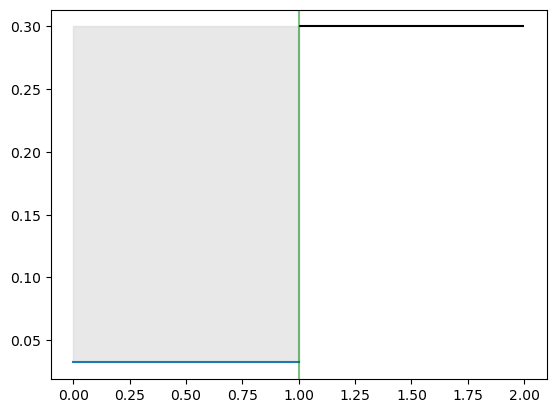

In [105]:
# no line_set w/o motion or shift
gpid = '2022091103_4827'
WINDOW_WIDTH = 3
LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
SPEED_MULTIPLIER_THRESHOLD = 2.0
SPEED_MULTIPLIER = 3

play = df_tracking.query('game_play_id == @gpid').copy()
off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()
off_players['s'] = np.where(
    off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
    off_players['s'] * SPEED_MULTIPLIER, 
    off_players['s']
)
off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)

off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

import matplotlib.pyplot as plt

event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
# print([f/10 for f in fids])
# print(play[event_col].value_counts() / 23)

plt.plot(off_team_smoothed.index, off_team_smoothed)
plt.hlines(LINE_SET_MEAN_SPEED_THRESHOLD, xmin=1,xmax=off_players.frame_id.max(), color='black')
plt.fill_between(
    off_team_smoothed.index,  # x values
    off_team_smoothed,        # y values
    LINE_SET_MEAN_SPEED_THRESHOLD,  # baseline
    where=off_team_smoothed < LINE_SET_MEAN_SPEED_THRESHOLD,  # condition for shading
    interpolate=True,         # interpolates between points
    color='lightgrey',       # shading color
    alpha=0.5                 # transparency
)
for fid in fids:
    plt.axvline(fid, color='green', alpha=0.5)

plot_play(df_tracking, gpid, event_col=event_col)

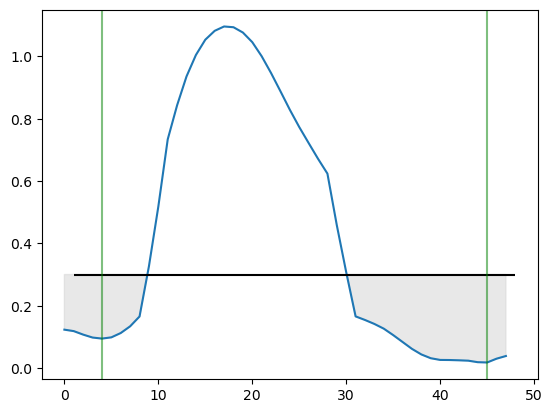

In [106]:
# no line_set w/ shift
gpid = '2022091109_3678'
WINDOW_WIDTH = 3
LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
SPEED_MULTIPLIER_THRESHOLD = 2.0
SPEED_MULTIPLIER = 3

play = df_tracking.query('game_play_id == @gpid').copy()
off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()
off_players['s'] = np.where(
    off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
    off_players['s'] * SPEED_MULTIPLIER, 
    off_players['s']
)
off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)

off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

import matplotlib.pyplot as plt

event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
# print([f/10 for f in fids])
# print(play[event_col].value_counts() / 23)

plt.plot(off_team_smoothed.index, off_team_smoothed)
plt.hlines(LINE_SET_MEAN_SPEED_THRESHOLD, xmin=1,xmax=off_players.frame_id.max(), color='black')
plt.fill_between(
    off_team_smoothed.index,  # x values
    off_team_smoothed,        # y values
    LINE_SET_MEAN_SPEED_THRESHOLD,  # baseline
    where=off_team_smoothed < LINE_SET_MEAN_SPEED_THRESHOLD,  # condition for shading
    interpolate=True,         # interpolates between points
    color='lightgrey',       # shading color
    alpha=0.5                 # transparency
)
for fid in fids:
    plt.axvline(fid, color='green', alpha=0.5)

plot_play(df_tracking, gpid, event_col=event_col)

In [164]:
# gpid = "2022091109_3678"
# play = df_tracking.query('game_play_id==@gpid and offense')
# keep_cols = ['position','frame_id','frame_type','event','event_new','s','consecutive_stationary']
# for i in range(1, 50, 1):
#     frame = play.query('frame_id==@i').sort_values('s', ascending=False)
#     print(f"Frame {i}:\n")
#     print(frame[keep_cols].to_string(index=False))  # Prevents line breaks in the output
#     print("\n" + "-"*50 + "\n") 

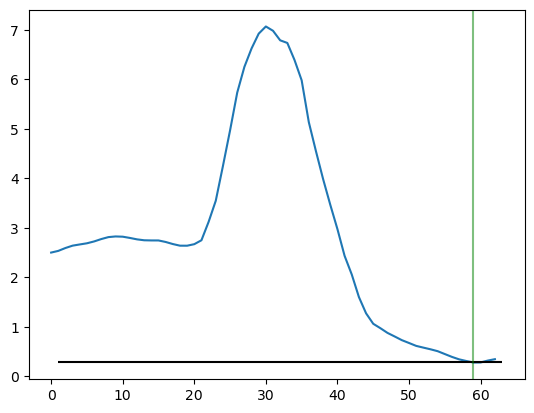

In [107]:
# no line_set w/o motion or shift
gpid = '2022091101_1826'
WINDOW_WIDTH = 3
LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
SPEED_MULTIPLIER_THRESHOLD = 2.0
SPEED_MULTIPLIER = 3

play = df_tracking.query('game_play_id == @gpid').copy()
off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()
off_players['s'] = np.where(
    off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
    off_players['s'] * SPEED_MULTIPLIER, 
    off_players['s']
)
off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)

off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

import matplotlib.pyplot as plt

event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
# print([f/10 for f in fids])
# print(play[event_col].value_counts() / 23)

plt.plot(off_team_smoothed.index, off_team_smoothed)
plt.hlines(LINE_SET_MEAN_SPEED_THRESHOLD, xmin=1,xmax=off_players.frame_id.max(), color='black')
plt.fill_between(
    off_team_smoothed.index,  # x values
    off_team_smoothed,        # y values
    LINE_SET_MEAN_SPEED_THRESHOLD,  # baseline
    where=off_team_smoothed < LINE_SET_MEAN_SPEED_THRESHOLD,  # condition for shading
    interpolate=True,         # interpolates between points
    color='lightgrey',       # shading color
    alpha=0.5                 # transparency
)
for fid in fids:
    plt.axvline(fid, color='green', alpha=0.5)

plot_play(df_tracking, gpid, event_col=event_col)

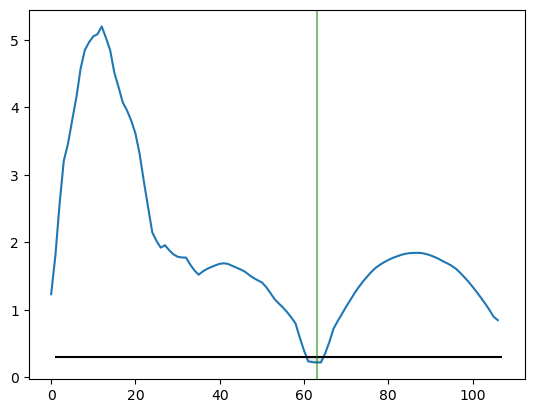

In [108]:
# no line_set w/ Fly motion
gpid = '2022091102_2436'
WINDOW_WIDTH = 3
LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
SPEED_MULTIPLIER_THRESHOLD = 2.0
SPEED_MULTIPLIER = 3

play = df_tracking.query('game_play_id == @gpid').copy()
off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()
off_players['s'] = np.where(
    off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
    off_players['s'] * SPEED_MULTIPLIER, 
    off_players['s']
)
off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)

off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

import matplotlib.pyplot as plt

event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
# print([f/10 for f in fids])
# print(play[event_col].value_counts() / 23)

plt.plot(off_team_smoothed.index, off_team_smoothed)
plt.hlines(LINE_SET_MEAN_SPEED_THRESHOLD, xmin=1,xmax=off_players.frame_id.max(), color='black')
plt.fill_between(
    off_team_smoothed.index,  # x values
    off_team_smoothed,        # y values
    LINE_SET_MEAN_SPEED_THRESHOLD,  # baseline
    where=off_team_smoothed < LINE_SET_MEAN_SPEED_THRESHOLD,  # condition for shading
    interpolate=True,         # interpolates between points
    color='lightgrey',       # shading color
    alpha=0.5                 # transparency
)
for fid in fids:
    plt.axvline(fid, color='green', alpha=0.5)

plot_play(df_tracking, gpid, event_col=event_col)

In [165]:
df_tracking.query('event_new=="line_set"').drop_duplicates(['game_play_id','frame_id','event_new']).game_play_id.value_counts()

2022091103_4993    19
2022091104_3122     9
2022091104_3204     8
2022091101_361      7
2022091101_3669     7
2022091101_3591     7
2022091101_2783     7
2022091101_63       7
2022091110_240      6
2022091113_3916     6
2022091106_792      6
2022091101_1785     6
2022091112_1058     6
2022091112_1144     6
2022091108_494      5
2022091113_2933     5
2022091102_2945     5
2022091101_3862     5
2022091101_3707     5
2022091110_569      5
2022091101_2951     5
2022091102_467      5
2022091101_2930     5
2022091101_2452     5
2022091101_213      5
2022091101_1945     5
2022091101_1901     5
2022091101_1516     5
2022091101_1384     5
2022091101_1276     5
2022091105_424      5
2022091106_1239     5
2022091100_2090     5
2022091113_2470     5
2022091200_983      5
2022091103_319      5
2022091104_3148     5
2022091103_955      5
2022090800_1102     5
2022091103_690      5
2022091103_632      5
2022091200_810      5
2022091200_716      5
2022091112_2370     5
2022091112_2246     5
2022091106

In [174]:
for gpid in line_set_frame_defaults:
    play = df_tracking.query('game_play_id==@gpid')
    fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
    print(f'{gpid}: {[f/10 for f in fids]}')

2022091100_1514: [3.5]
2022091100_2204: [4.6]
2022091101_1826: [6.3]
2022091101_3221: [4.8]
2022091101_993: [15.7]
2022091102_1631: [9.3]
2022091102_2436: [10.7]
2022091102_800: [3.3]
2022091103_3613: [2.0]
2022091104_1826: [9.8]
2022091104_2736: [7.8]
2022091104_3730: [5.2]
2022091106_1609: [9.8]
2022091106_2384: [8.4]
2022091106_2956: [10.7]
2022091106_3002: [7.0]
2022091106_998: [7.7]
2022091107_2866: [5.6]
2022091107_744: [9.1]
2022091108_1354: [17.8]
2022091109_3909: [1.0]
2022091113_3894: [12.1]
2022091113_630: [7.2]
2022091200_3596: [14.0]


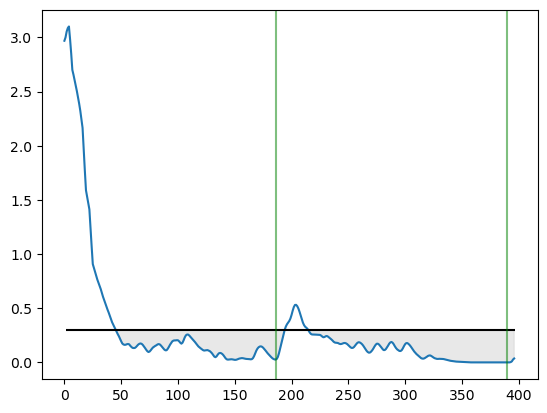

In [109]:
# no line_set w/ Fly shift and Fly motion
gpid = '2022091104_3122'
WINDOW_WIDTH = 3
LINE_SET_MEAN_SPEED_THRESHOLD = 0.3
SPEED_MULTIPLIER_THRESHOLD = 2.0
SPEED_MULTIPLIER = 3

play = df_tracking.query('game_play_id == @gpid').copy()
off_players = play[(play.offense) & (play.frame_type == 'BEFORE_SNAP')].copy()
off_players['s'] = np.where(
    off_players['s'] >= SPEED_MULTIPLIER_THRESHOLD, 
    off_players['s'] * SPEED_MULTIPLIER, 
    off_players['s']
)
off_team = off_players[['frame_id', 's']].groupby('frame_id')['s'].mean().reset_index(drop=True)

off_team_smoothed = off_team.rolling(window=WINDOW_WIDTH, min_periods=1, center=True).mean()

import matplotlib.pyplot as plt

event_col = 'event_new'
play = df_tracking.query('game_play_id==@gpid')
fids = play[play[event_col] == 'line_set'].frame_id.unique().tolist()
# print([f/10 for f in fids])
# print(play[event_col].value_counts() / 23)

plt.plot(off_team_smoothed.index, off_team_smoothed)
plt.hlines(LINE_SET_MEAN_SPEED_THRESHOLD, xmin=1,xmax=off_players.frame_id.max(), color='black')
plt.fill_between(
    off_team_smoothed.index,  # x values
    off_team_smoothed,        # y values
    LINE_SET_MEAN_SPEED_THRESHOLD,  # baseline
    where=off_team_smoothed < LINE_SET_MEAN_SPEED_THRESHOLD,  # condition for shading
    interpolate=True,         # interpolates between points
    color='lightgrey',       # shading color
    alpha=0.5                 # transparency
)
for fid in fids:
    plt.axvline(fid, color='green', alpha=0.5)

plot_play(df_tracking, gpid, event_col=event_col)

In [7]:
from os.path import join

ICLOUD_PATH = r'/Users/lukeneuendorf/Library/Mobile Documents/com~apple~CloudDocs/bdb25'
df_tracking.to_pickle(join(ICLOUD_PATH, 'data', 'tracking_w1.pickle'))
df_play.to_pickle(join(ICLOUD_PATH, 'data', 'play_w1.pickle'))